# Data Preparation

In [1]:
!pip install -q kaggle

In [2]:
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [3]:
!kaggle datasets download -d aneesarom/rider-with-helmet-without-helmet-number-plate

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 10, in <module>
    sys.exit(main())
             ^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/cli.py", line 68, in main
    out = args.func(**command_args)
          ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 1741, in dataset_download_cli
    with self.build_kaggle_client() as kaggle:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/kaggle/api/kaggle_api_extended.py", line 688, in build_kaggle_client
    username=self.config_values['username'],
             ~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^
KeyError: 'username'


In [4]:
!unzip -q rider-with-helmet-without-helmet-number-plate.zip

unzip:  cannot find or open rider-with-helmet-without-helmet-number-plate.zip, rider-with-helmet-without-helmet-number-plate.zip.zip or rider-with-helmet-without-helmet-number-plate.zip.ZIP.


In [5]:
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 70.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 106.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [6]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.5/112.6 GB disk)


In [7]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("aneesarom/rider-with-helmet-without-helmet-number-plate")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/rider-with-helmet-without-helmet-number-plate


In [8]:
path

'/kaggle/input/rider-with-helmet-without-helmet-number-plate'

In [9]:
from glob import glob
from itertools import chain
from collections import Counter
from pprint import pprint

id2class_map = {
    '0': 'with helmet',
    '1': 'without helmet',
    '2': 'rider',
    '3': 'number_plate'
}

def print_data_size(folder_type):
    data_size = len(glob(f'{path}/{folder_type}/labels/*.txt'))
    print(f'{folder_type} data count: {data_size}')

def print_class_count(folder_type):
    class_list = []
    for file in glob(f'{path}/{folder_type}/labels/*.txt'):
        class_list.append([row.split()[0] for row in open(file, "r")])
    counter = Counter(list(chain(*class_list)))
    print(f'-- data class count')
    pprint({f'{k}. {id2class_map[k]}':v for k, v in counter.items()})
    print()

print_data_size('train')
print_class_count('train')
print_data_size('val')
print_class_count('val')

train data count: 104
-- data class count
{'0. with helmet': 64,
 '1. without helmet': 93,
 '2. rider': 120,
 '3. number_plate': 116}

val data count: 20
-- data class count
{'0. with helmet': 13,
 '1. without helmet': 15,
 '2. rider': 23,
 '3. number_plate': 22}



# Data Training

In [10]:
import os
import cv2
from matplotlib import pyplot as plt


def load_image(image_name, data_type='train', main_path=path):
    img_path = os.path.join(main_path, data_type, 'images', f'{image_name}.jpg')
    image = cv2.imread(img_path)

    if image is None:
        print(f"Error: Image '{img_path}' not found or could not be read.")
        return None

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def get_bbox_and_label(image_name, data_type='train', main_path=path):
    ''' get bbox and label information from label txt files '''

    # read file from path
    lbl_path = os.path.join(main_path, data_type, 'labels', f'{image_name}.txt')
    with open(lbl_path, 'r') as f:
        lines = f.readlines()

    # extract bboxes and labels from the label file
    bboxes = [
        [float(n) for n in line.split()[1:]]
        for line in lines
    ]
    labels = [id2class_map[line.split()[0]] for line in lines]

    return bboxes, labels

def load_image(image_name, data_type='train', main_path=path):
    img_path = os.path.join(main_path, data_type, 'images', f'{image_name}.jpg')
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def get_bbox_coordinates(img, bbox):
    img_height, img_width, _ = img.shape
    x_center, y_center, bbox_width, bbox_height = bbox

    # calculate the coordinates of the bounding box
    x_center_pixel = x_center * img_width
    y_center_pixel = y_center * img_height
    half_width = bbox_width * img_width / 2
    half_height = bbox_height * img_height / 2

    x_min = int(x_center_pixel - half_width)
    y_min = int(y_center_pixel - half_height)
    x_max = int(x_center_pixel + half_width)
    y_max = int(y_center_pixel + half_height)

    return x_min, y_min, x_max, y_max

class2color_map = {
    'with helmet': (0,255,128),
    'without helmet': (255,51,51),
    'rider': (51,255,255),
    'number_plate': (224,102,255)
}

def plot_image(image_name, data_type='train', class2color_map=class2color_map):
    img = load_image(image_name=image_name, data_type=data_type)

    if img is None:
        print("Skipping image plot due to loading error.")
        return

    bboxes, labels = get_bbox_and_label(image_name=image_name, data_type=data_type)
    for bbox, label in zip(bboxes, labels):
        color = class2color_map[label]
        x_min, y_min, x_max, y_max = get_bbox_coordinates(img, bbox)
        img = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)
        img = cv2.putText(img, label, (x_min, y_min + 10),
                          fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.6,
                          color=color, thickness=2)

    plt.imshow(img)
    plt.show()

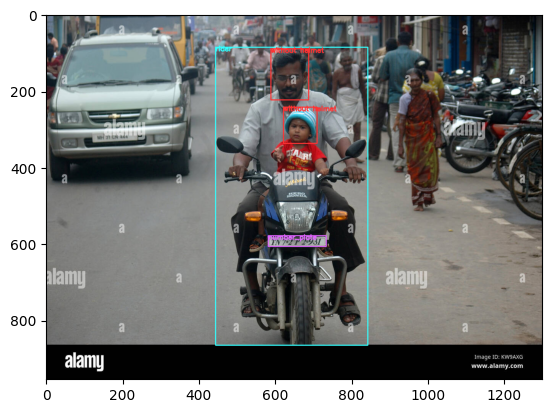

In [11]:
plot_image(image_name='new100')

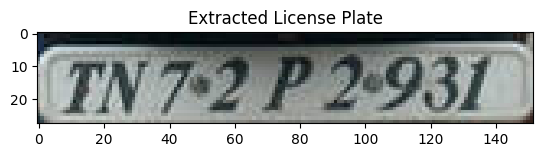

In [12]:
# Extract the license plate

def extract_license_plate(image_name, data_type='train'):
    """
    Extracts the license plate image from a given image.
    """
    img = load_image(image_name=image_name, data_type=data_type)
    if img is None:
        return None

    bboxes, labels = get_bbox_and_label(image_name=image_name, data_type=data_type)

    license_plate_bbox = None
    for bbox, label in zip(bboxes, labels):
        if label == 'number_plate':
            license_plate_bbox = bbox
            break  # Assume only one license plate per image

    if license_plate_bbox is None:
        print(f"No license plate found in image '{image_name}'.")
        return None

    x_min, y_min, x_max, y_max = get_bbox_coordinates(img, license_plate_bbox)
    license_plate_image = img[y_min:y_max, x_min:x_max]

    return license_plate_image


# Example usage
license_plate = extract_license_plate(image_name='new100')

if license_plate is not None:
    plt.imshow(license_plate)
    plt.title("Extracted License Plate")
    plt.show()

In [13]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLOv8n model
model = YOLO('yolov8n.pt')

# Display model information (optional)
model.info()

100%|██████████| 6.25M/6.25M [00:00<00:00, 92.9MB/s]


YOLOv8n summary: 129 layers, 3,157,200 parameters, 0 gradients, 8.9 GFLOPs


(129, 3157200, 0, 8.8575488)

In [14]:
import yaml

# read the content of coco128.yaml
with open(os.path.join(path, 'coco128.yaml'), 'r') as file:
    print(file.read())

train: /train/images
val: /val/images

nc: 4

names: ["with helmet", "without helmet", "rider", "number plate"]


In [15]:
# Create the directory if it doesn't exist
os.makedirs('/kaggle/working', exist_ok=True)

data = {
    'train': os.path.join(path, 'train'), # Correct path to training data
    'val': os.path.join(path, 'val'),   # Correct path to validation data
    'nc': 4,
    'names': [
        'with helmet',
        'without helmet',
        'rider',
        'number plate'
    ]
}

with open('/kaggle/working/data.yaml', 'w') as file:
    yaml.dump(data, file)

# check the content of data.yaml
with open('/kaggle/working/data.yaml', 'r') as file:
    print(file.read())

names:
- with helmet
- without helmet
- rider
- number plate
nc: 4
train: /kaggle/input/rider-with-helmet-without-helmet-number-plate/train
val: /kaggle/input/rider-with-helmet-without-helmet-number-plate/val



In [16]:
!pip install -q gradio ultralytics

In [17]:
import gradio as gr
from ultralytics import YOLO
import os # You might need os for path handling if your model is in a specific location
import cv2 # If your helper functions like plot_image or extract_license_plate are used
import matplotlib.pyplot as plt # If you plan to display images within the new notebook outside of Gradio

In [18]:
# disable wandb
os.environ['WANDB_MODE'] = "disabled"


# command to train the YOLOv8 model
model.train(
    data='/kaggle/working/data.yaml',
    epochs=50,
    workers=1,
    batch=8,
)

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=Tru

100%|██████████| 755k/755k [00:00<00:00, 116MB/s]

Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 22        [15, 18, 21]  1    752092  ultralytics.nn.modules.head.Detect           [4, [64, 128, 256]]           
Model summary: 129 layers, 3,011,628 parameters, 3,011,612 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 89.9MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 16.3±8.6 MB/s, size: 554.2 KB)


train: Scanning /kaggle/input/rider-with-helmet-without-helmet-number-plate/train/labels... 18 images, 0 backgrounds, 0 corrupt:  17%|█▋        | 18/104 [00:00<00:01, 75.83it/s]/usr/local/lib/python3.11/dist-packages/PIL/Image.py:3570: UserWarning: image file could not be identified because AVIF support not installed
  warnings.warn(message)
train: Scanning /kaggle/input/rider-with-helmet-without-helmet-number-plate/train/labels... 102 images, 0 backgrounds, 2 corrupt: 100%|██████████| 104/104 [00:01<00:00, 73.54it/s]

train: /kaggle/input/rider-with-helmet-without-helmet-number-plate/train/images/new128.jpg: ignoring corrupt image/label: cannot identify image file '/kaggle/input/rider-with-helmet-without-helmet-number-plate/train/images/new128.jpg'
train: /kaggle/input/rider-with-helmet-without-helmet-number-plate/train/images/new3.jpg: ignoring corrupt image/label: invalid image format GIF. Supported formats are:
images: {'bmp', 'pfm', 'dng', 'webp', 'tiff', 'jpeg', 'png', 'tif', 'heic', 'jpg', 'mpo'}
videos: {'mov', 'mkv', 'mp4', 'wmv', 'asf', 'avi', 'mpg', 'm4v', 'ts', 'mpeg', 'webm', 'gif'}
WARNING ⚠️ train: Cache directory /kaggle/input/rider-with-helmet-without-helmet-number-plate/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 45.9±25.1 MB/s, size: 695.8 KB)


val: Scanning /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/labels... 20 images, 0 backgrounds, 0 corrupt: 100%|██████████| 20/20 [00:00<00:00, 75.10it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/rider-with-helmet-without-helmet-number-plate/val is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 1 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.06G      1.114      3.468      1.291         33        640: 100%|██████████| 13/13 [00:04<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         20         73       0.02      0.311      0.212      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.31G     0.9009      2.321      1.125         38        640: 100%|██████████| 13/13 [00:02<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.08it/s]

                   all         20         73     0.0243      0.347      0.223      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      1.33G     0.9401      1.577      1.182         46        640: 100%|██████████| 13/13 [00:03<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.90it/s]


                   all         20         73      0.936      0.185      0.671      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      1.35G     0.9155      1.416      1.125         53        640: 100%|██████████| 13/13 [00:02<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.05it/s]

                   all         20         73      0.955      0.251      0.708      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      1.35G     0.9162      1.304        1.1         47        640: 100%|██████████| 13/13 [00:02<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.13it/s]

                   all         20         73      0.692      0.371      0.782      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      1.35G      0.865      1.142       1.06         59        640: 100%|██████████| 13/13 [00:02<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.82it/s]

                   all         20         73      0.743       0.48      0.726      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      1.35G     0.9093       1.14      1.095         41        640: 100%|██████████| 13/13 [00:03<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.56it/s]

                   all         20         73      0.773      0.516      0.765       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      1.35G     0.8824      1.053      1.089         57        640: 100%|██████████| 13/13 [00:02<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.72it/s]

                   all         20         73      0.759      0.602       0.84      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      1.36G     0.8901      1.086      1.101         37        640: 100%|██████████| 13/13 [00:02<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.03it/s]

                   all         20         73      0.824      0.765      0.869      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      1.37G     0.8295     0.9909       1.02         52        640: 100%|██████████| 13/13 [00:03<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.56it/s]

                   all         20         73       0.71      0.738      0.792      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      1.37G     0.8403      0.963      1.077         53        640: 100%|██████████| 13/13 [00:02<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.86it/s]

                   all         20         73      0.866      0.829        0.9      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      1.38G     0.7726      0.925      1.038         33        640: 100%|██████████| 13/13 [00:02<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.87it/s]

                   all         20         73       0.85      0.857       0.91      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      1.38G      0.805     0.9166      1.028         37        640: 100%|██████████| 13/13 [00:02<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.98it/s]

                   all         20         73      0.854      0.857      0.914      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      1.38G     0.7981     0.9348      1.055         50        640: 100%|██████████| 13/13 [00:03<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.09it/s]

                   all         20         73      0.845      0.822      0.898      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       1.4G     0.7822     0.8683      1.036         44        640: 100%|██████████| 13/13 [00:03<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.78it/s]

                   all         20         73      0.885      0.794      0.878      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       1.4G     0.7468     0.8591      1.009         36        640: 100%|██████████| 13/13 [00:02<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.65it/s]

                   all         20         73      0.918       0.84      0.899      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       1.4G     0.7754     0.8434       1.03         35        640: 100%|██████████| 13/13 [00:03<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.50it/s]

                   all         20         73      0.928      0.885      0.934      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       1.4G     0.7594     0.8322      1.017         36        640: 100%|██████████| 13/13 [00:02<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.68it/s]

                   all         20         73      0.892      0.894      0.931      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       1.4G     0.7636     0.8022      1.008         36        640: 100%|██████████| 13/13 [00:02<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.41it/s]

                   all         20         73      0.889      0.871      0.913      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       1.4G     0.7204     0.7897       1.01         35        640: 100%|██████████| 13/13 [00:02<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.86it/s]

                   all         20         73       0.92      0.882      0.922      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       1.4G     0.7329     0.8034       1.02         58        640: 100%|██████████| 13/13 [00:02<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.67it/s]

                   all         20         73      0.939      0.857      0.918      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       1.4G     0.7121     0.7733     0.9887         45        640: 100%|██████████| 13/13 [00:02<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.27it/s]

                   all         20         73      0.934      0.899      0.921      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       1.4G     0.6815     0.7401      0.975         56        640: 100%|██████████| 13/13 [00:02<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.28it/s]

                   all         20         73      0.881       0.92      0.905      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       1.4G     0.6803     0.7304     0.9666         55        640: 100%|██████████| 13/13 [00:03<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.83it/s]

                   all         20         73      0.893      0.902      0.912      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       1.4G     0.6644     0.7245      0.984         36        640: 100%|██████████| 13/13 [00:02<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.99it/s]

                   all         20         73      0.937      0.914      0.932      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       1.4G     0.6725     0.7221     0.9574         59        640: 100%|██████████| 13/13 [00:02<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.84it/s]

                   all         20         73      0.934      0.888      0.933      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       1.4G     0.6507     0.6737     0.9744         44        640: 100%|██████████| 13/13 [00:02<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.08it/s]

                   all         20         73      0.935      0.893      0.939      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       1.4G     0.6825     0.7426      1.004         44        640: 100%|██████████| 13/13 [00:02<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.34it/s]

                   all         20         73      0.943      0.876      0.946      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       1.4G      0.685     0.7008     0.9861         38        640: 100%|██████████| 13/13 [00:02<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.56it/s]

                   all         20         73      0.928      0.895      0.948       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       1.4G     0.6179     0.6978     0.9774         34        640: 100%|██████████| 13/13 [00:02<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.20it/s]

                   all         20         73      0.921      0.912       0.95      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50       1.4G     0.6385     0.6852     0.9704         50        640: 100%|██████████| 13/13 [00:03<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.58it/s]

                   all         20         73       0.92      0.938      0.952      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       1.4G     0.6145     0.6547     0.9557         48        640: 100%|██████████| 13/13 [00:02<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.18it/s]

                   all         20         73      0.929      0.928      0.947      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       1.4G     0.6529     0.6683     0.9661         43        640: 100%|██████████| 13/13 [00:02<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.28it/s]

                   all         20         73      0.953      0.899      0.939      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       1.4G     0.6229     0.6292     0.9662         52        640: 100%|██████████| 13/13 [00:02<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.66it/s]

                   all         20         73      0.949      0.899      0.938      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       1.4G     0.6012     0.6184     0.9601         46        640: 100%|██████████| 13/13 [00:02<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.11it/s]

                   all         20         73      0.939      0.905      0.947      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      1.42G     0.6108     0.6487     0.9699         49        640: 100%|██████████| 13/13 [00:02<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.51it/s]

                   all         20         73      0.926      0.912      0.945      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      1.42G     0.5887     0.6106      0.934         31        640: 100%|██████████| 13/13 [00:02<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.80it/s]

                   all         20         73      0.921      0.906      0.942      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      1.42G     0.5847     0.6291      0.947         43        640: 100%|██████████| 13/13 [00:03<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.61it/s]

                   all         20         73      0.922      0.912      0.947      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      1.43G      0.626     0.6519     0.9732         41        640: 100%|██████████| 13/13 [00:02<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.10it/s]

                   all         20         73      0.928      0.894      0.948      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      1.43G      0.581     0.6222     0.9757         37        640: 100%|██████████| 13/13 [00:02<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.70it/s]

                   all         20         73      0.936      0.891      0.952      0.795


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      1.43G     0.5606     0.7912     0.9028         22        640: 100%|██████████| 13/13 [00:04<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         20         73      0.942      0.891      0.946      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      1.45G     0.5327     0.7125     0.8929         22        640: 100%|██████████| 13/13 [00:02<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.37it/s]

                   all         20         73       0.94      0.889      0.934      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      1.45G     0.5258     0.7183     0.8865         30        640: 100%|██████████| 13/13 [00:02<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.23it/s]

                   all         20         73      0.936      0.883      0.915      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      1.45G     0.5437     0.7247     0.9013         19        640: 100%|██████████| 13/13 [00:03<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.97it/s]


                   all         20         73      0.917       0.89      0.904      0.758

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      1.45G     0.5152     0.6717     0.8969         19        640: 100%|██████████| 13/13 [00:02<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.27it/s]

                   all         20         73      0.927      0.891      0.907       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      1.45G     0.5108     0.6313     0.8949         20        640: 100%|██████████| 13/13 [00:02<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.46it/s]

                   all         20         73      0.913      0.911       0.91      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      1.45G     0.4953      0.611     0.8685         22        640: 100%|██████████| 13/13 [00:02<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.67it/s]

                   all         20         73      0.925      0.918      0.913      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      1.45G     0.4876     0.6086     0.8719         20        640: 100%|██████████| 13/13 [00:03<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.47it/s]

                   all         20         73      0.934      0.906      0.919      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      1.45G     0.4994     0.6263      0.888         20        640: 100%|██████████| 13/13 [00:02<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.91it/s]

                   all         20         73      0.924      0.902      0.925      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      1.45G     0.4809     0.6057     0.8952         17        640: 100%|██████████| 13/13 [00:02<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.61it/s]

                   all         20         73      0.933      0.892      0.927      0.772



50 epochs completed in 0.052 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.55it/s]


                   all         20         73       0.92      0.938      0.952      0.802
           with helmet         12         13      0.923      0.923      0.937      0.786
        without helmet         10         15      0.873      0.917      0.913      0.745
                 rider         20         23      0.921      0.913      0.961      0.851
          number plate         20         22      0.963          1      0.995      0.825
Speed: 0.2ms preprocess, 2.6ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ac8d39b9a10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [19]:
# save the model
model.save('best.pt')
print(model.info())

Model summary: 129 layers, 3,011,628 parameters, 0 gradients, 8.2 GFLOPs
(129, 3011628, 0, 8.197376)


In [20]:
model_path = 'best.pt' # Or the full path to your model file
if os.path.exists(model_path):
  print(f"Loading model from: {model_path}")
  model = YOLO(model_path)
  # Optional: Print model info to confirm it's the expected model
  print(model.info())
else:
  print(f"Error: Model file not found at {model_path}")
  # Handle this error - perhaps raise an exception or exit

Loading model from: best.pt
Model summary: 129 layers, 3,011,628 parameters, 0 gradients, 8.2 GFLOPs
(129, 3011628, 0, 8.197376)



image 1/20 /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/images/new0.jpg: 640x576 2 without helmets, 1 rider, 1 number plate, 35.5ms
image 2/20 /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/images/new113.jpg: 640x576 2 with helmets, 1 rider, 1 number plate, 7.2ms
image 3/20 /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/images/new115.jpg: 576x640 1 with helmet, 1 rider, 1 number plate, 34.4ms
image 4/20 /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/images/new127.jpg: 640x640 2 without helmets, 2 riders, 2 number plates, 7.9ms
image 5/20 /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/images/new137.jpg: 640x352 1 without helmet, 1 rider, 1 number plate, 35.8ms
image 6/20 /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/images/new26.jpg: 384x640 2 without helmets, 1 rider, 1 number plate, 34.3ms
image 7/20 /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/images/new28.jpg:

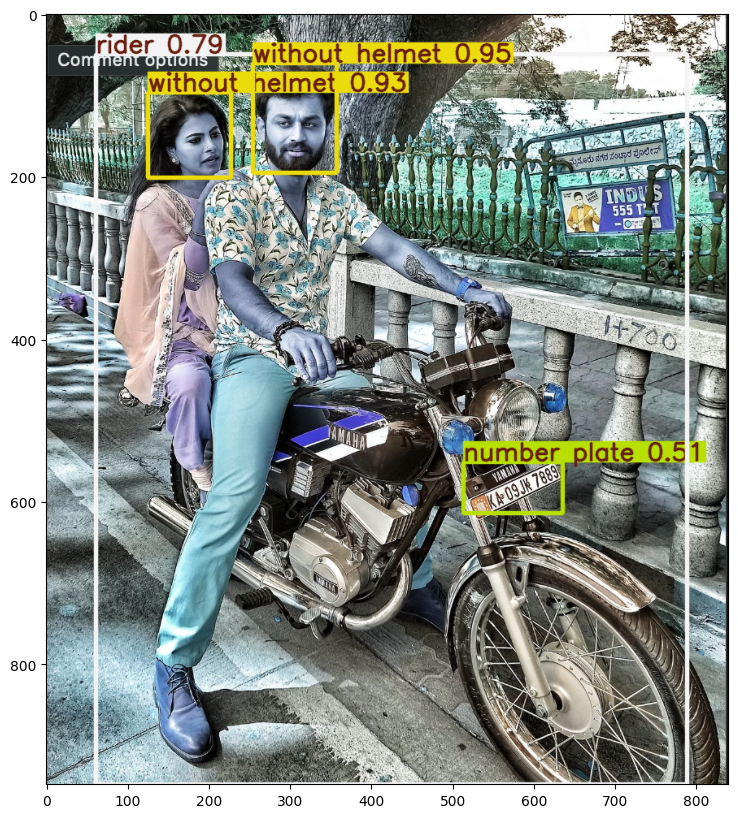

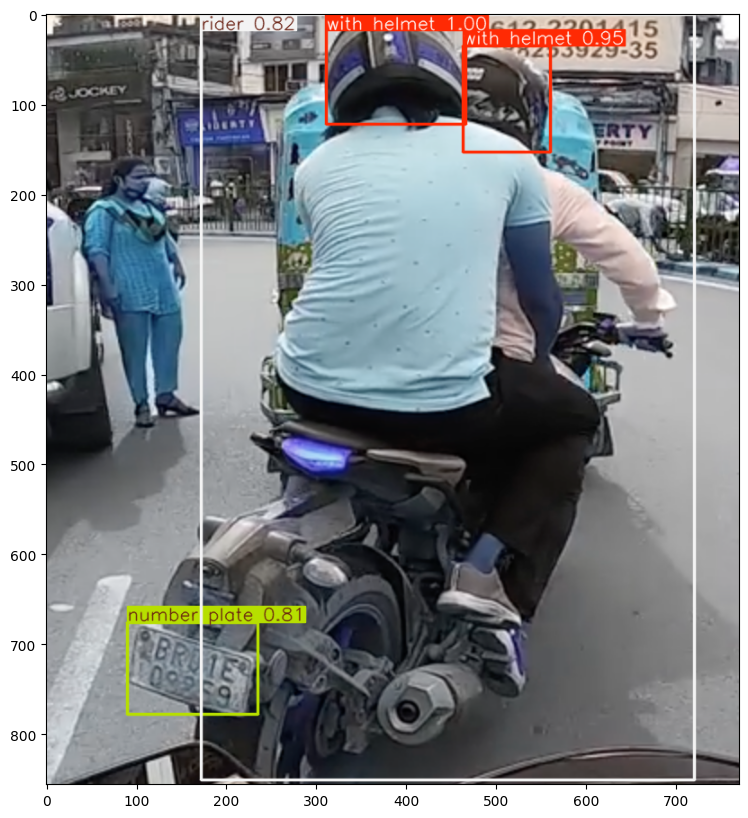

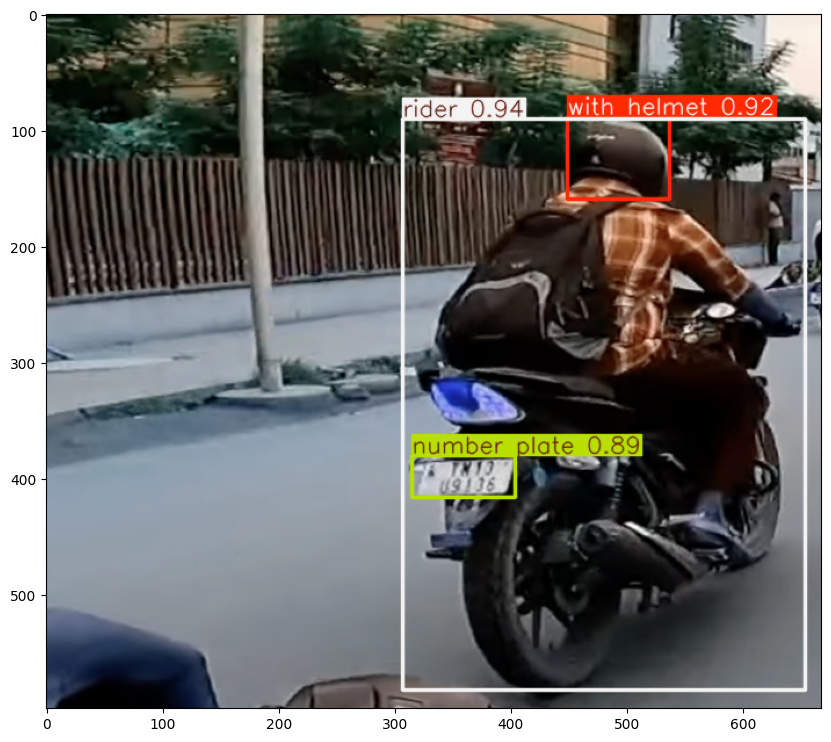

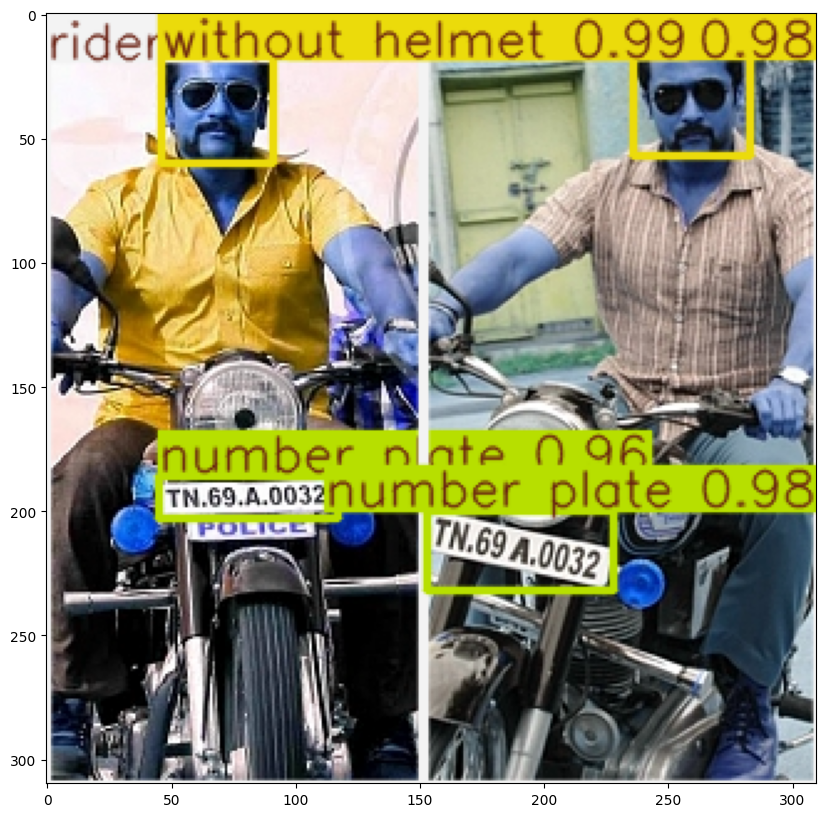

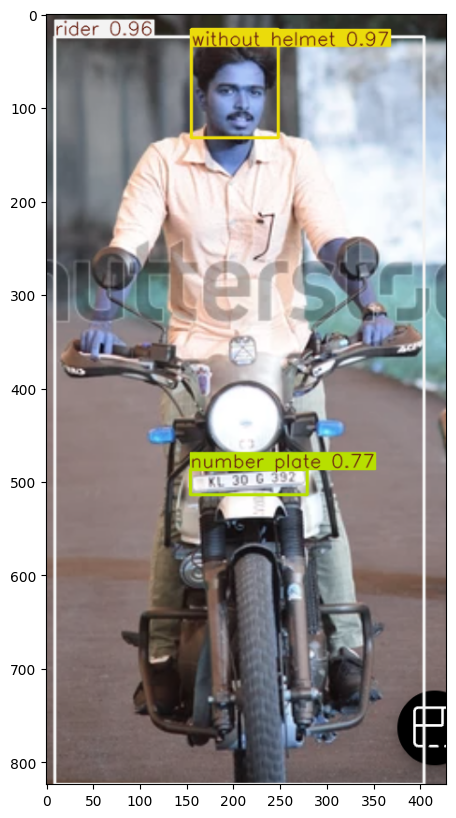

...

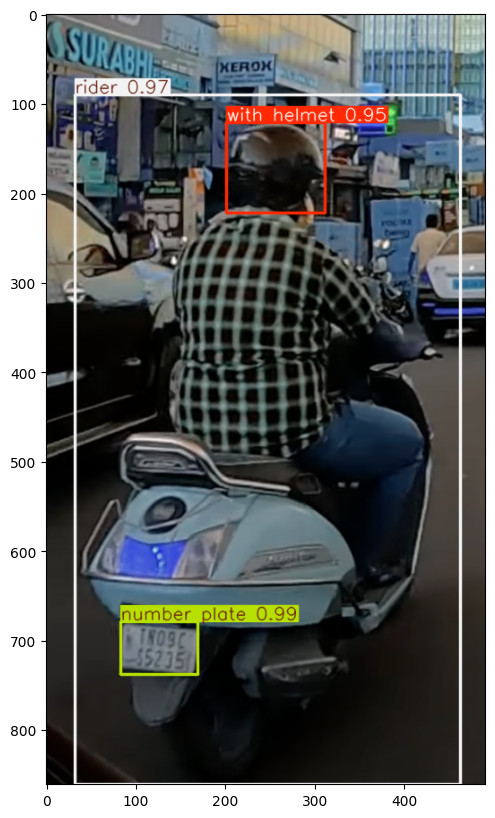

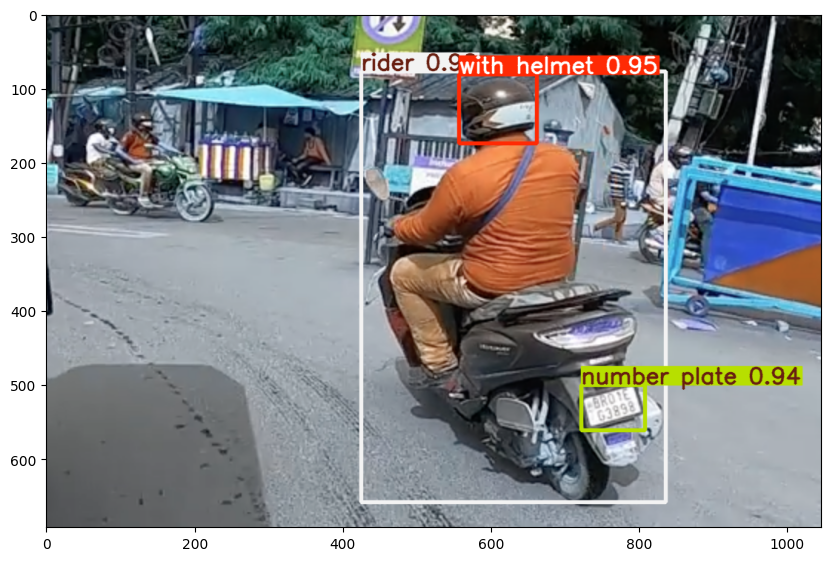

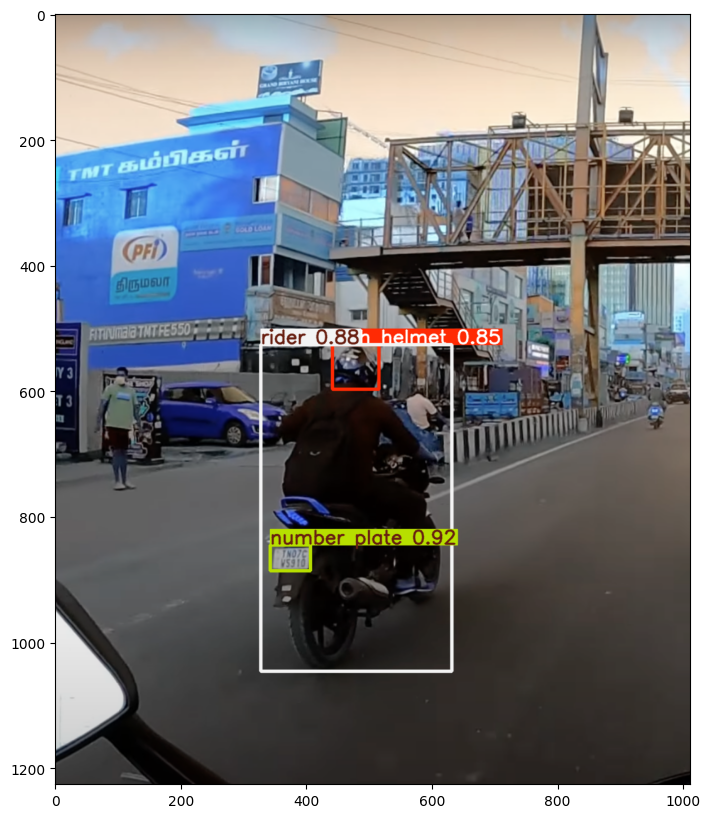

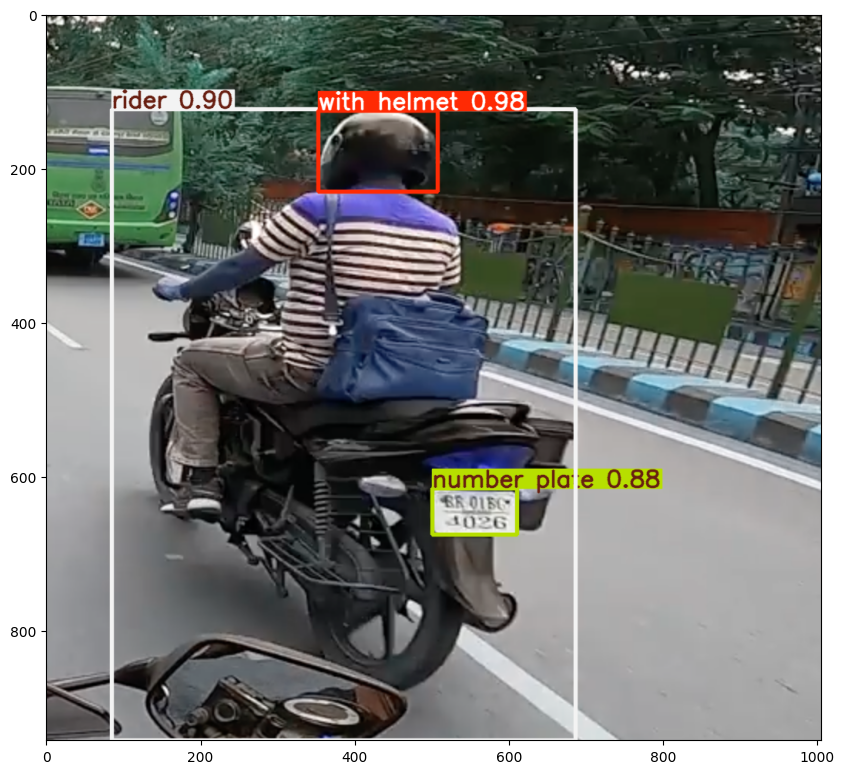

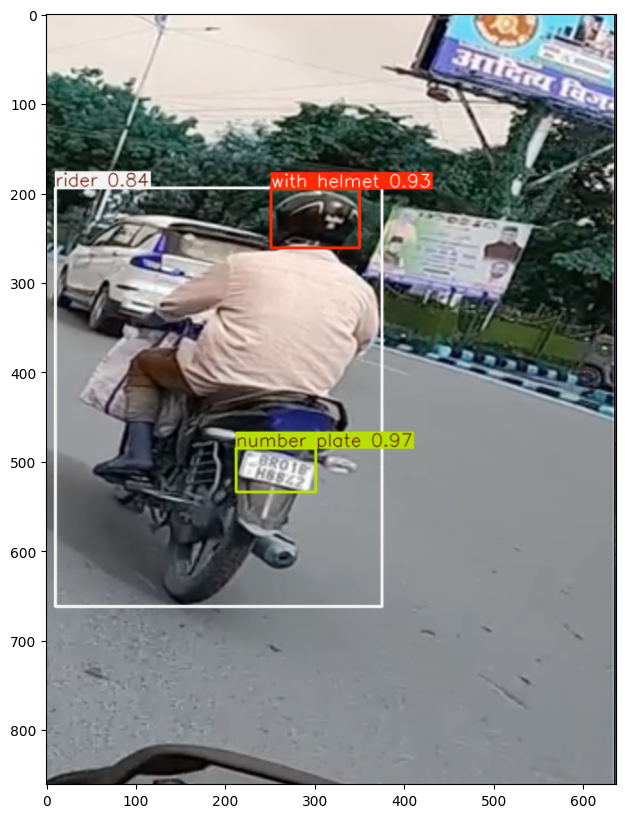

In [21]:
results = model.predict(source=os.path.join(path, 'val', 'images'), save=True)
# Display prediction plots
for r in results:
    im_array = r.plot()
    plt.figure(figsize=(10,10))
    plt.imshow(im_array)
    plt.show()

In [22]:
def plot_pred_image(image_name, id2class_map=id2class_map, class2color_map=class2color_map):
    image_path = os.path.join(path, 'val', 'images', f'{image_name}.jpg')

    # get plot elements (bbox, labels) from `predict()` results
    results = model.predict(image_path)
    r = results[0]
    img = r.orig_img
    bboxes = r.boxes.xyxy.tolist()
    labels = [id2class_map[str(int(c))] for c in r.boxes.cls.tolist()]
    for bbox, label in zip(bboxes, labels):
        # get bbox and label info
        color = class2color_map[label]
        x_min, y_min, x_max, y_max = [int(n) for n in bbox]

        # add bounding box with rectangle
        img = cv2.rectangle(img,(x_min,y_min),(x_max,y_max), color, 2)

        # add label info
        img = cv2.putText(
                img,
                label,
                (x_min, y_min + 10),
                fontFace = cv2.FONT_HERSHEY_SIMPLEX,
                fontScale = 0.6,
                color = color,
                thickness=2
            )
    plt.imshow(img)
    plt.show()

prediction ↓

image 1/1 /kaggle/input/rider-with-helmet-without-helmet-number-plate/val/images/new127.jpg: 640x640 2 without helmets, 2 riders, 2 number plates, 12.1ms
Speed: 3.8ms preprocess, 12.1ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 640)


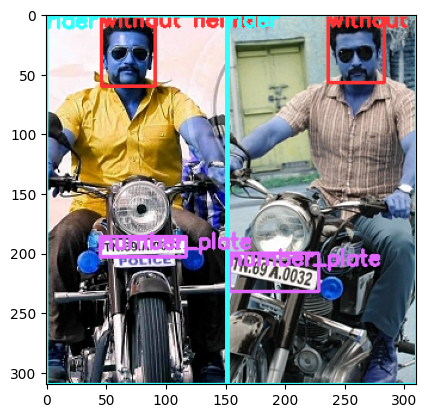

actual image ↓


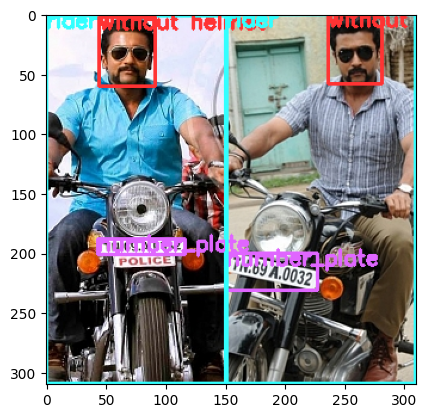

In [23]:
image_name = 'new127'
print('prediction ↓')
plot_pred_image(image_name=image_name)
print('actual image ↓')
plot_image(image_name=image_name, data_type='val')

# Model Evaluation

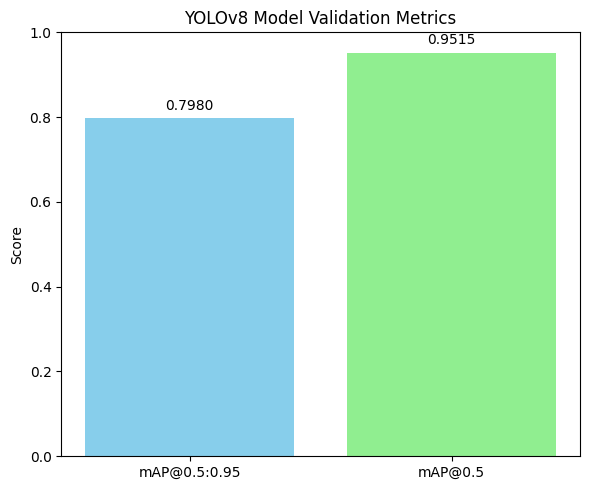


Model Validation Metrics:
mAP@0.5:0.95 (Average Precision across IoU thresholds 0.5 to 0.95): 0.7980
mAP@0.5 (Average Precision at IoU threshold 0.5): 0.9515


In [28]:
# Kode untuk mendapatkan metrik evaluasi sudah ada di notebook Anda
# Gunakan hasil dari `metrics = model.val()`

# Asumsikan variabel 'metrics' sudah ada setelah menjalankan model.val()
# Jika belum, jalankan kembali sel kode di notebook yang menjalankan model.val()
# metrics = model.val() # Pastikan ini sudah dijalankan

# Dapatkan nilai metrik yang relevan
map_val = metrics.box.map    # mAP@0.5:0.95
map50_val = metrics.box.map50 # mAP@0.5

# Nama metrik
metric_names = ['mAP@0.5:0.95', 'mAP@0.5']
metric_values = [map_val, map50_val]

plt.figure(figsize=(6, 5))

# Membuat bar plot untuk metrik
plt.bar(metric_names, metric_values, color=['skyblue', 'lightgreen'])

plt.ylabel('Score')
plt.title('YOLOv8 Model Validation Metrics')
plt.ylim(0, 1) # Metrik mAP berada antara 0 dan 1

# Menambahkan nilai metrik di atas bar
for i, value in enumerate(metric_values):
    plt.text(i, value + 0.02, f'{value:.4f}', ha='center')

plt.tight_layout()
plt.show()

# Atau, tampilkan sebagai teks juga untuk kejelasan
print("\nModel Validation Metrics:")
print(f"mAP@0.5:0.95 (Average Precision across IoU thresholds 0.5 to 0.95): {map_val:.4f}")
print(f"mAP@0.5 (Average Precision at IoU threshold 0.5): {map50_val:.4f}")

# Interface

In [32]:
import gradio as gr
from ultralytics import YOLO
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt # Still useful for debugging or potential other uses


# --- Load Both Models ---
# Load the base YOLO model (e.g., yolov8n.pt) for initial motorcycle detection
try:
    base_yolo_model = YOLO('yolov8n.pt')
    print("Base YOLO model loaded.")
except Exception as e:
    print(f"Error loading base YOLO model: {e}")
    base_yolo_model = None # Handle case where base model fails to load

# Load your trained model for helmet, rider, license plate detection
model_path = 'best.pt'
try:
    if os.path.exists(model_path):
        print(f"Loading trained model from: {model_path}")
        trained_model = YOLO(model_path)
        print("Trained model loaded.")
    else:
        print(f"Error: Trained model file not found at {model_path}")
        trained_model = None # Handle case where trained model fails to load
except Exception as e:
     print(f"Error loading trained model: {e}")
     trained_model = None


# --- Mappings ---
# Ensure id2class_map is defined for your TRAINED model's classes
# This is needed for the report, to translate class IDs back to names
id2class_map_trained = {
    0: 'with helmet',
    1: 'without helmet',
    2: 'rider',
    3: 'number_plate'
}

# Need the class ID for 'motorcycle' from the BASE YOLO model's classes
# For COCO dataset, 'motorcycle' is typically class ID 3
motorcycle_class_id_base_model = 3

# --- Detection and Reporting Function (Continued) ---
def process_image_plot_method(image):
    """
    Detects motorcycles using the base model.
    If a motorcycle is detected, uses the trained model to detect helmets/license plates,
    uses model.plot() for output image, and generates a report.
    """
    if image is None:
        return None, "Please upload an image.", []

    if base_yolo_model is None or trained_model is None:
        return image, "Error: Models not loaded. Please check the notebook output for loading errors.", []

    # Keep a copy of the original image in RGB
    original_image_rgb = image.copy()

    # --- Step 1: Detect Motorcycles using the Base Model ---
    base_results = base_yolo_model.predict(source=image, conf=0.4) # Use a reasonable conf threshold for base model
    base_r = base_results[0]

    motorcycle_detected = False
    if base_r.boxes is not None: # Check if any boxes were detected by the base model
        base_detected_class_ids = base_r.boxes.cls.tolist()
        if motorcycle_class_id_base_model in base_detected_class_ids:
            motorcycle_detected = True

    report_summary = ""
    annotated_image = original_image_rgb # Default to original image
    license_plate_images = []

    # --- Step 2: If Motorcycle Detected, Use Trained Model, Plot, and Report ---
    if motorcycle_detected:
        report_summary += "Motorcycle detected by base model.\n"

        # Use the trained model to detect relevant objects
        # Important: Use a confidence threshold that you are comfortable with
        # This threshold directly affects which detections are included in the plot and report
        # Setting verbose=False to reduce prediction output in the console
        trained_results = trained_model.predict(source=image, conf=0.5, verbose=False) # Adjust conf as needed
        trained_r = trained_results[0]

        # Use the built-in plot method of the trained model's result object
        # This will draw bounding boxes and labels for all detections in trained_r
        # based on the confidence threshold set in the predict call.
        annotated_image = trained_r.plot() # Returns numpy array (RGB)

        # Initialize report variables based on trained model detections
        helmet_count = 0
        without_helmet_count = 0
        rider_count = 0 # Count riders detected by the trained model
        license_plate_count = 0

        if trained_r.boxes is not None: # Check if any boxes were detected by the trained model
            # Get class IDs and confidence scores from the trained model's results
            trained_detected_class_ids = trained_r.boxes.cls.tolist()
            trained_detected_conf_scores = trained_r.boxes.conf.tolist()
            trained_bboxes_xyxy = trained_r.boxes.xyxy.tolist()

            # Count occurrences of specific classes
            helmet_count = trained_detected_class_ids.count(0) # Class ID 0 is 'with helmet'
            without_helmet_count = trained_detected_class_ids.count(1) # Class ID 1 is 'without helmet'
            rider_count = trained_detected_class_ids.count(2) # Class ID 2 is 'rider'
            license_plate_count = trained_detected_class_ids.count(3) # Class ID 3 is 'number_plate'


            # Extract and store license plate images (from trained model)
            # Need to convert the original image to BGR temporarily for slicing with OpenCV
            img_bgr_for_slicing = cv2.cvtColor(original_image_rgb, cv2.COLOR_RGB2BGR)

            for i, class_id_float in enumerate(trained_detected_class_ids):
                class_id_int = int(class_id_float)

                if class_id_int == 3: # Class ID 3 is 'number_plate'
                    x_min, y_min, x_max, y_max = [int(coord) for coord in trained_bboxes_xyxy[i]]

                    # Extract the license plate region (make sure coordinates are valid)
                    # Use original_image_rgb shape for bounds checking
                    if y_min >= 0 and y_max <= original_image_rgb.shape[0] and x_min >= 0 and x_max <= original_image_rgb.shape[1]:
                        # Slice from the BGR image copy
                        license_plate_img_bgr = img_bgr_for_slicing[y_min:y_max, x_min:x_max]
                        # Convert back to RGB before adding to the list for Gradio Gallery
                        license_plate_images.append(cv2.cvtColor(license_plate_img_bgr, cv2.COLOR_BGR2RGB))


            # Build the report summary based on trained model results
            report_summary += f"Riders detected (by trained model): {rider_count}\n"
            report_summary += f"Riders with helmet detected: {helmet_count}\n"
            report_summary += f"Riders without helmet detected: {without_helmet_count}\n"
            # You could calculate percentage of helmets if rider_count > 0
            # if rider_count > 0:
            #     helmet_percentage = (helmet_count / rider_count) * 100 if rider_count > 0 else 0
            #     report_summary += f"Percentage of riders with helmets: {helmet_percentage:.2f}%\n"

            report_summary += f"Number of license plates detected: {license_plate_count}\n"


        else: # If trained model found no boxes despite base model finding motorcycle
            report_summary += "Trained model did not detect any objects.\n"


    else:
        # No motorcycle detected by the base model
        report_summary += "No motorcycle detected by base model. Skipping detailed analysis.\n"
        annotated_image = original_image_rgb # Return the original image
        # No license plate images to return if no motorcycle is detected

    # Return the annotated image (NumPy array), report summary string, and list of license plate images (NumPy arrays)
    return annotated_image, report_summary, license_plate_images


# --- Create the Gradio Interface ---
# Now define three outputs: the annotated image, the report text, and a gallery for license plates
iface_two_models_report = gr.Interface(
    fn=process_image_plot_method, # Use the new function
    inputs=gr.Image(type="numpy"),
    # Outputs: Annotated Image, Report Textbox, Gallery for License Plates
    outputs=[
        gr.Image(type="numpy", label="Annotated Image"),
        gr.Textbox(label="Detection Report"),
        gr.Gallery(label="Extracted License Plates", allow_preview=True) # Use Gallery for multiple images
        ],
    title="Helmet and License Plate Detection",
    description="Upload an image. Detects motorcycles first. If found, detects helmets/license plates and provides a report, including extracted license plates."
)

# --- Launch the Interface ---
# Make sure both models are loaded before launching!
if base_yolo_model is not None and trained_model is not None:
    iface_two_models_report.launch(debug=True)
else:
    print("Gradio interface not launched because one or more models failed to load.")

Base YOLO model loaded.
Loading trained model from: best.pt
Trained model loaded.
It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://c5198a371c41968242.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)



0: 384x640 5 persons, 1 car, 4 motorcycles, 42.4ms
Speed: 2.5ms preprocess, 42.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 448x640 4 persons, 1 bicycle, 2 motorcycles, 1 truck, 65.1ms
Speed: 3.5ms preprocess, 65.1ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 9 persons, 4 motorcycles, 42.2ms
Speed: 2.3ms preprocess, 42.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 persons, 3 motorcycles, 7.3ms
Speed: 2.7ms preprocess, 7.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 480x640 4 persons, 1 bicycle, 1 backpack, 45.3ms
Speed: 3.9ms preprocess, 45.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

0: 384x640 5 persons, 1 car, 4 motorcycles, 43.2ms
Speed: 2.7ms preprocess, 43.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 1 car, 4 motorcycles, 10.5ms
Speed: 3.8ms preprocess, 10.5ms inference, 2.8ms postpro